# Chi-Squared Analysis — $c_0$ from library MF3, MF34 + MF33 eval $\sigma$

> **Scope: this is a *library-trust* self-consistency check, not an independent agreement metric.**
>
> Each library's $c_0$ comes from its own MF3 (a fit largely informed by the EXFOR data we compare against), and $\sigma_{\mathrm{eval}}$ includes the library's own MF33 magnitude uncertainty. So this notebook answers *"do the libraries agree with their own MF33-claimed uncertainties on the EXFOR points they were fit to?"* — **not** *"how much do the libraries deviate in shape from EXFOR?"*. For the latter, see [`chi2_analysis_exfor_c0.ipynb`](chi2_analysis_exfor_c0.ipynb), where $c_0$ is anchored to Kinney/Smith directly and only MF34 (shape) covariance is propagated.

Comparison of evaluated angular distributions (JEFF-4.0, JENDL-5, This work)
against EXFOR Fe-56 elastic data in $E\in[0.85, 4.0]$ MeV.

**Construction of $y_{\mathrm{eval}}$** (per `precompute_chi2_library_c0.py`):

- $a_l(E)$ — interpolated linearly from each library's MF4 grid; truncated to
  $L=6$ for all three libraries.
- $c_0(E) = \langle\sigma_{\mathrm{MF3}}\rangle/(4\pi)$ — averaged over the
  MF4 energy bin containing $E$, using each library's own MF4 grid and
  trapezoidal integration on MF3's native pointwise grid.
- $\sigma_{\mathrm{eval}}(E,\mu) = \sqrt{\sigma_{a_l}^2 + (\delta\sigma_{\mathrm{rel}}\cdot |y_{\mathrm{eval}}|)^2}$
  with $\sigma_{a_l}$ = MF34 sandwich on $a_l$ propagated to $d\sigma/d\Omega(\mu)$
  and $\delta\sigma_{\mathrm{rel}} = \sqrt{\langle\mathrm{var}_{\mathrm{rel}}\rangle_{\mathrm{MF33}}}$
  averaged length-weighted over the same MF4 bin used for $c_0$.

**Metric.** Per-experiment Mahalanobis $\chi^2$ with rank-1 systematic
correlation (same definition as in the EXFOR-anchored notebook).

**Six scenarios** = three data subsets × two variance budgets (mirrors
`chi2_analysis_exfor_c0.ipynb`):

|  | $\sigma_\mathrm{exp}$ only | $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$ |
|---|---|---|
| All experiments | 1a | 1b |
| Excluding K&S | 2a | 2b |
| Only K&S | 3a | 3b |

The "$\sigma_\mathrm{exp}$ only" rows zero out $\sigma_\mathrm{eval}$ in $D$
to test the libraries' MF3 c_0 + a_l shape against the data with **no**
library-claimed covariance widening the denominator. The
"$\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$" rows include MF34+MF33 in
$D$ to test whether the library-claimed magnitude+shape covariance is wide
enough to absorb the residuals.


In [1]:
# ── Imports & Configuration ───────────────────────────────────────────────────

import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from pathlib import Path

# Local module — Mahalanobis chi^2 with rank-1 per-experiment systematic correlation.
sys.path.insert(0, str(Path(__file__).parent if '__file__' in globals() else '/home/MONLEON-JUAN/kika/scripts'))
import chi2_metrics

PARQUET_PATH = '/share_snc/snc/JuanMonleon/chi2/chi2_data_library_c0_72.parquet'
EVAL_COV_PATH = PARQUET_PATH + '.eval_cov.npz'
eval_cov = chi2_metrics.load_eval_cov(EVAL_COV_PATH)
print(f'Loaded {len(eval_cov)} per-(library, experiment) Sigma_eval blocks from {EVAL_COV_PATH}')

E_MIN = 0.85   # MeV
E_MAX = 4.0    # MeV

# Kinney (10571002) and Smith (10886002) — K&S anchor experiments.
KINNEY_SMITH_IDS = ['10571002', '10886002']

LIB_LABELS = {'JEFF': 'JEFF-4.0', 'JENDL': 'JENDL-5', 'This_work': 'This work'}
LIB_COLORS = {'JEFF': '#1f77b4', 'JENDL': '#2ca02c', 'This_work': '#d62728'}

plt.rcParams.update({
    'figure.dpi': 300, 'savefig.dpi': 300,
    'axes.grid': True, 'grid.alpha': 0.3,
    'font.size': 14, 'axes.labelsize': 15, 'axes.titlesize': 15,
    'legend.fontsize': 12, 'xtick.labelsize': 13, 'ytick.labelsize': 13,
})

SAVE_FIGURES = True
FIGURES_DIR = Path('/share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0')
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_FORMAT = 'png'
FIGURE_DPI = 300


def save_fig(fig, name):
    if SAVE_FIGURES:
        path = FIGURES_DIR / f'{name}.{FIGURE_FORMAT}'
        fig.savefig(path, dpi=FIGURE_DPI, bbox_inches='tight')
        print(f'Saved: {path}')


In [2]:
# ── Load + filter; residuals come from chi2_metrics ───────────────────────────

df_raw = pd.read_parquet(PARQUET_PATH)
print(f"Raw data: {len(df_raw)} rows")

libs_in_data = sorted(df_raw['library'].unique())
LIBRARIES = [lib for lib in libs_in_data if lib in LIB_LABELS]
print(f"Libraries detected: {[LIB_LABELS[lib] for lib in LIBRARIES]}")

df = df_raw[(df_raw['energy_mev'] >= E_MIN) & (df_raw['energy_mev'] <= E_MAX)].copy()
print(f"After energy filter [{E_MIN}, {E_MAX}] MeV: {len(df)} rows")

bad_mask = (df['sigma_exp'] <= 0) | ~np.isfinite(df['sigma_exp'])
n_bad = int(bad_mask.sum())
if n_bad > 0:
    print(f"Dropping {n_bad} rows with sigma_exp <= 0 or non-finite")
    df = df[~bad_mask].copy()

df['sigma_eval_diag'] = df['sigma_eval_diag'].fillna(0.0)

print(f"\nFinal dataset: {len(df)} rows")
print(f"Libraries: {df['library'].unique().tolist()}")
print(f"Experiments: {df['experiment_id'].nunique()}")

df['is_KS'] = df['experiment_id'].isin(KINNEY_SMITH_IDS)
print(f"\nRows by subset and library:")
for lib in LIBRARIES:
    sub = df[df['library'] == lib]
    n_all = len(sub)
    n_ks  = int(sub['is_KS'].sum())
    n_no  = n_all - n_ks
    print(f"  {LIB_LABELS[lib]:12s}  all={n_all}  no_KS={n_no}  only_KS={n_ks}")


Raw data: 140508 rows
Libraries detected: ['JEFF-4.0', 'JENDL-5', 'This work']
After energy filter [0.85, 4.0] MeV: 140508 rows
Dropping 231 rows with sigma_exp <= 0 or non-finite

Final dataset: 140277 rows
Libraries: ['JEFF', 'JENDL', 'This_work']
Experiments: 68

Rows by subset and library:
  JEFF-4.0      all=46759  no_KS=33061  only_KS=13698
  JENDL-5       all=46759  no_KS=33061  only_KS=13698
  This work     all=46759  no_KS=33061  only_KS=13698


In [3]:
# ── Mahalanobis scenario runner ───────────────────────────────────────────────
#
# One pipeline, one metric: per-experiment Mahalanobis chi^2 with rank-1
# systematic correlation from chi2_metrics.mahalanobis_chi2_per_experiment.
# Per-row contribution is z_i^2 (whitened residual squared); sum over an
# experiment equals chi^2_e (whitening identity, verified to 1e-14 rel).


def run_scenario(df_s, scenario_key, scenario_label, eval_cov_s):
    print(f"\n{'='*70}")
    print(f"SCENARIO {scenario_key}: {scenario_label}")
    print(f"{'='*70}")
    print(f"Data points: {len(df_s)}, Experiments: {df_s['experiment_id'].nunique()}")
    print(f"\nRows per library:")
    print(df_s.groupby('library').size().to_string())

    # Per-experiment Mahalanobis chi^2 + per-row whitened residuals.
    per_exp_raw = chi2_metrics.mahalanobis_chi2_per_experiment(df_s, eval_cov_s)
    z = chi2_metrics.whitened_residuals_per_experiment(df_s, eval_cov_s)

    # Decorate per-experiment table with author/year/E for plotting.
    meta = (
        df_s.groupby(['experiment_id', 'library'], observed=True)
            .agg(author=('author', 'first'),
                 year=('year', 'first'),
                 E_min=('energy_mev', 'min'),
                 E_max=('energy_mev', 'max'))
            .reset_index()
    )
    exp_df = per_exp_raw.merge(meta, on=['experiment_id', 'library'])
    exp_df['year'] = exp_df['year'].apply(lambda y: int(y) if pd.notna(y) else '')

    suffix = scenario_key
    n_libs = len(LIBRARIES)
    markers = {'JEFF': 'o', 'JENDL': 's', 'This_work': 'D'}
    year_offsets = {'JEFF': -0.3, 'JENDL': 0.0, 'This_work': 0.3}

    # 1. Global chi2/N bar
    summary = chi2_metrics.aggregate_chi2_by_library(per_exp_raw, LIB_LABELS)
    print(f"\n{summary[['Library', 'N', 'chi2_per_N']].to_string(index=False, float_format='%.3f')}")

    fig_w = max(5, 2 + n_libs * 1.2)
    fig, ax = plt.subplots(figsize=(fig_w, 4))
    labels = [LIB_LABELS[lib] for lib in LIBRARIES]
    values = [summary.loc[summary['library_key'] == lib, 'chi2_per_N'].values[0] for lib in LIBRARIES]
    colors = [LIB_COLORS[lib] for lib in LIBRARIES]
    bars = ax.bar(labels, values, color=colors, edgecolor='k', linewidth=0.5)
    ax.axhline(1.0, color='k', ls='--', lw=0.8, label=r'$\chi^2/N = 1$')
    for bar, val in zip(bars, values):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                f'{val:.2f}', ha='center', va='bottom', fontsize=12)
    ax.set_ylabel(r'$\chi^2 / N$')
    ax.set_title(f'Scenario {scenario_key}: {scenario_label}')
    ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_global_bar_{suffix}'); plt.show()

    # 2. Per-experiment chi^2/N pivot table
    pivot = exp_df.pivot_table(
        index=['experiment_id', 'author', 'year', 'E_min', 'E_max'],
        columns='library', values='chi2_per_N',
    )
    libs_in_pivot = [l for l in LIBRARIES if l in pivot.columns]
    pivot['avg'] = pivot[libs_in_pivot].mean(axis=1)
    pivot = pivot.sort_values('avg', ascending=False)
    n_per_exp = exp_df.groupby('experiment_id')['N'].first()
    pivot = pivot.join(n_per_exp, on='experiment_id')

    print(f"\nPer-experiment chi^2/N (sorted by avg, descending):\n")
    with pd.option_context('display.max_rows', 50, 'display.float_format', '{:.2f}'.format):
        display_cols = [c for c in pivot.columns if c != 'avg']
        print(pivot[display_cols].fillna('--').to_string())

    # 3. Per-experiment chi^2/N histogram
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        vals = exp_df.loc[exp_df['library'] == lib, 'chi2_per_N'].dropna()
        median_val = vals.median()
        ax.hist(vals, bins=max(5, len(vals) // 2), color=LIB_COLORS[lib],
                edgecolor='k', alpha=0.7)
        ax.axvline(1.0, color='k', ls='--', lw=1, label=r'$\chi^2/N=1$')
        ax.axvline(median_val, color='gray', ls=':', lw=1.2,
                   label=f'median = {median_val:.2f}')
        ax.set_xlabel(r'$\chi^2/N$'); ax.set_title(LIB_LABELS[lib]); ax.legend(fontsize=11)
    axes.flat[0].set_ylabel('Number of experiments')
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'chi2_per_experiment_histogram_{suffix}'); plt.show()

    # 4. Chi^2 contribution per experiment (%)
    CONTRIB_THRESHOLD = 1.0
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs + 1, 7), sharey=False, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        sub = exp_df[exp_df['library'] == lib].copy()
        total_chi2 = sub['chi2'].sum()
        sub['pct'] = 100.0 * sub['chi2'] / total_chi2
        above = sub[sub['pct'] >= CONTRIB_THRESHOLD].sort_values('pct', ascending=True)
        below = sub[sub['pct'] < CONTRIB_THRESHOLD]
        bar_labels = [f"{r['author']} ({r['year']})" for _, r in above.iterrows()]
        if len(below) > 0:
            bar_labels = [f'Other ({len(below)} exp.)'] + bar_labels
            vals = [below['pct'].sum()] + above['pct'].tolist()
            cols = ['#cccccc'] + [LIB_COLORS[lib]] * len(above)
        else:
            vals = above['pct'].tolist()
            cols = [LIB_COLORS[lib]] * len(above)
        ax.barh(bar_labels, vals, color=cols, edgecolor='k', linewidth=0.5)
        ax.set_xlabel(r'Contribution to total $\chi^2$ (%)')
        ax.set_title(LIB_LABELS[lib])
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'chi2_contribution_{suffix}'); plt.show()

    # 5. Cumulative chi^2 waterfall
    fig, ax = plt.subplots(figsize=(10, 5))
    for lib in LIBRARIES:
        sub = exp_df[exp_df['library'] == lib].sort_values('chi2', ascending=False).reset_index(drop=True)
        total = sub['chi2'].sum()
        sub['cum_pct'] = 100.0 * sub['chi2'].cumsum() / total
        ax.plot(range(1, len(sub) + 1), sub['cum_pct'], 'o-',
                color=LIB_COLORS[lib], label=LIB_LABELS[lib], markersize=5)
    ax.axhline(80, color='#333333', ls='--', lw=2.0, alpha=0.9, label='80%')
    ax.axhline(95, color='#333333', ls=':', lw=2.0, alpha=0.9, label='95%')
    ax.set_xlabel(r'Experiment rank (by $\chi^2$ contribution)')
    ax.set_ylabel(r'Cumulative $\chi^2$ (%)')
    ax.set_title(f'Scenario {scenario_key}'); ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_waterfall_{suffix}'); plt.show()

    # 6. Chi^2/N vs publication year
    fig, ax = plt.subplots(figsize=(10, 5))
    for lib in LIBRARIES:
        sub = exp_df[exp_df['library'] == lib].copy()
        sub['year_num'] = pd.to_numeric(sub['year'], errors='coerce')
        sub = sub.dropna(subset=['year_num'])
        offset = year_offsets.get(lib, 0.0)
        ax.scatter(sub['year_num'] + offset, sub['chi2_per_N'],
                   c=LIB_COLORS[lib], marker=markers.get(lib, 'o'),
                   s=50, alpha=0.7, edgecolors='k', linewidths=0.3,
                   label=LIB_LABELS[lib], zorder=3)
    ax.axvspan(1982, 2016, alpha=0.10, color='gray', zorder=0)
    ax.axhline(1.0, color='k', ls='--', lw=0.8, label=r'$\chi^2/N = 1$')
    ax.set_xlabel('Publication year'); ax.set_ylabel(r'$\chi^2 / N$')
    ax.set_yscale('log'); ax.set_title(f'Scenario {scenario_key}'); ax.legend()
    fig.tight_layout(); save_fig(fig, f'chi2_vs_year_{suffix}'); plt.show()

    # 7. Whitened-residual statistics (target N(0,1) under correct covariance)
    df_z = df_s.assign(z=z.values)
    res_rows = []
    for lib in LIBRARIES:
        zr = df_z.loc[df_z['library'] == lib, 'z'].values
        res_rows.append({
            'Library': LIB_LABELS[lib],
            'mean': np.mean(zr), 'std': np.std(zr, ddof=1),
            'skewness': stats.skew(zr), 'kurtosis': stats.kurtosis(zr),
            '|z|>2 (%)': 100.0 * np.mean(np.abs(zr) > 2),
            '|z|>3 (%)': 100.0 * np.mean(np.abs(zr) > 3),
        })
    res_df = pd.DataFrame(res_rows)
    print(f"\nWhitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, "
          f"|z|>2: 4.6%, |z|>3: 0.3%)\n")
    print(res_df.to_string(index=False, float_format='%.3f'))

    # 8. Whitened-residual histograms with N(0,1) overlay
    x_grid = np.linspace(-6, 6, 300)
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        zr = df_z.loc[df_z['library'] == lib, 'z'].values
        mu_fit, sigma_fit = stats.norm.fit(zr)
        ax.hist(zr, bins=80, density=True, color=LIB_COLORS[lib],
                edgecolor='k', linewidth=0.3, alpha=0.7, label=LIB_LABELS[lib])
        ax.plot(x_grid, stats.norm.pdf(x_grid, 0, 1), 'k--', lw=2.0, label=r'$\mathcal{N}(0,1)$')
        ax.plot(x_grid, stats.norm.pdf(x_grid, mu_fit, sigma_fit), 'r-', lw=1.5,
                label=f'fit $\mathcal{{N}}$({mu_fit:.2f},{sigma_fit:.2f})')
        ax.set_xlabel('Whitened residual $z$', fontsize=15); ax.set_xlim(-6, 6); ax.legend(fontsize=12)
    axes.flat[0].set_ylabel('Density', fontsize=15)
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'whitened_residual_histograms_{suffix}'); plt.show()

    # 9. Whitened residual vs energy scatter
    fig, axes = plt.subplots(1, n_libs, figsize=(5 * n_libs, 4.5), sharey=True, squeeze=False)
    for ax, lib in zip(axes.flat, LIBRARIES):
        sub = df_z[df_z['library'] == lib]
        ax.scatter(sub['energy_mev'], sub['z'], s=3, alpha=0.2,
                   color=LIB_COLORS[lib], rasterized=True)
        ax.axhline(0, color='k', lw=0.8)
        ax.axhline(2, color='gray', ls='--', lw=0.6, alpha=0.7)
        ax.axhline(-2, color='gray', ls='--', lw=0.6, alpha=0.7)
        ax.set_xscale('log'); ax.set_xlabel('Energy (MeV)'); ax.set_title(LIB_LABELS[lib])
    axes.flat[0].set_ylabel('Whitened residual $z$')
    fig.suptitle(f'Scenario {scenario_key}', fontsize=14, y=1.02)
    fig.tight_layout(); save_fig(fig, f'whitened_residual_vs_energy_{suffix}'); plt.show()

    return summary[['Library', 'library_key', 'N', 'chi2_per_N']]


<>:170: SyntaxWarning: invalid escape sequence '\m'
<>:170: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_19792/592329619.py:170: SyntaxWarning: invalid escape sequence '\m'
  label=f'fit $\mathcal{{N}}$({mu_fit:.2f},{sigma_fit:.2f})')


In [4]:
# ── Subsets used for the 6 scenarios ──────────────────────────────────────────

df_all     = df.copy()
df_no_KS   = df[~df['is_KS']].copy()
df_only_KS = df[ df['is_KS']].copy()

print(f"all     : {len(df_all):>6d} rows, {df_all['experiment_id'].nunique()} experiments")
print(f"no_KS   : {len(df_no_KS):>6d} rows, {df_no_KS['experiment_id'].nunique()} experiments")
print(f"only_KS : {len(df_only_KS):>6d} rows, {df_only_KS['experiment_id'].nunique()} experiments")


all     : 140277 rows, 68 experiments
no_KS   :  99183 rows, 66 experiments
only_KS :  41094 rows, 2 experiments


## Scenario 1a — All experiments, σ_exp only



SCENARIO 1a: All experiments, σ_exp only
Data points: 140277, Experiments: 68

Rows per library:
library
JEFF         46759
JENDL        46759
This_work    46759

  Library     N  chi2_per_N
 JEFF-4.0 46759    3424.312
  JENDL-5 46759    3213.353
This work 46759    3031.199
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_1a.png


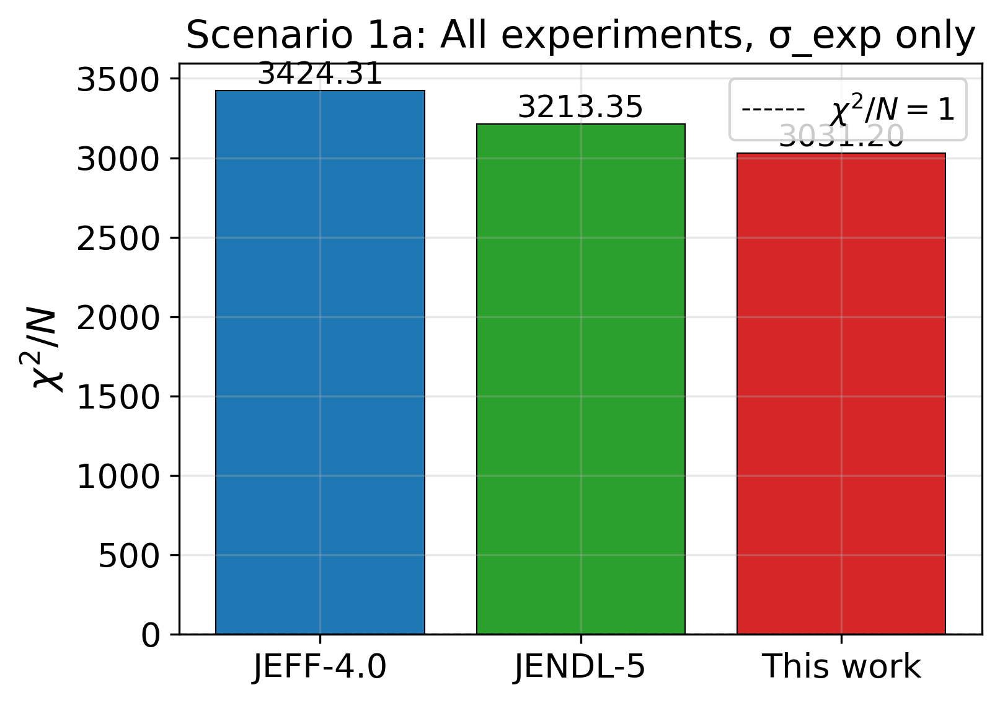


Per-experiment chi^2/N (sorted by avg, descending):

                                               JEFF      JENDL  This_work      N
experiment_id author     year E_min E_max                                       
20482005      Cabe       1967 0.97  0.97  870079.43 1155560.68   96572.22     11
11519016      Cox        1966 0.86  1.23  392911.52  355967.58  373236.63    368
10332004      Cox        1972 0.90  0.90  165654.43  223391.89   24267.18      8
13511004      Perey      1991 0.85  0.85   52077.50   42639.86   43996.42     18
11638003      Darden     1955 1.00  1.55   58501.33   57444.10   12394.77      6
11717002      Landon     1958 2.20  2.20   45870.96   64837.94   14576.02     14
20008003      Tomita     1973 1.47  1.47    5711.52    8626.06    1549.53     13
20008013      Tomita     1973 1.94  1.94    5908.72    8044.13     689.76     14
11396011      Cranberg   1956 2.25  2.45    1774.21    1855.66    1127.91      7
20008004      Tomita     1973 1.56  1.56    1820.83    

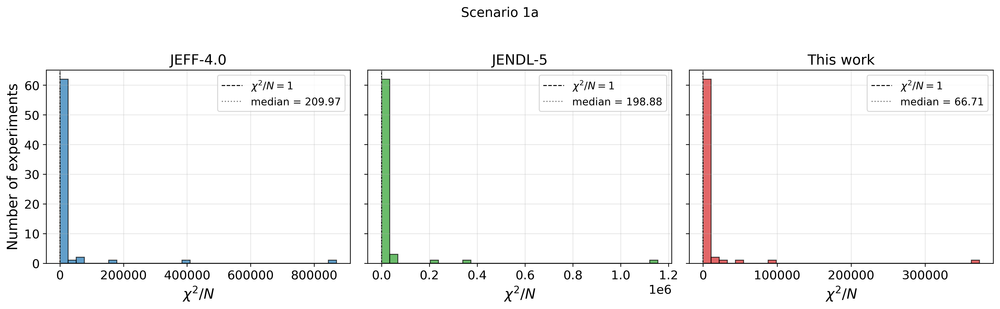

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_1a.png


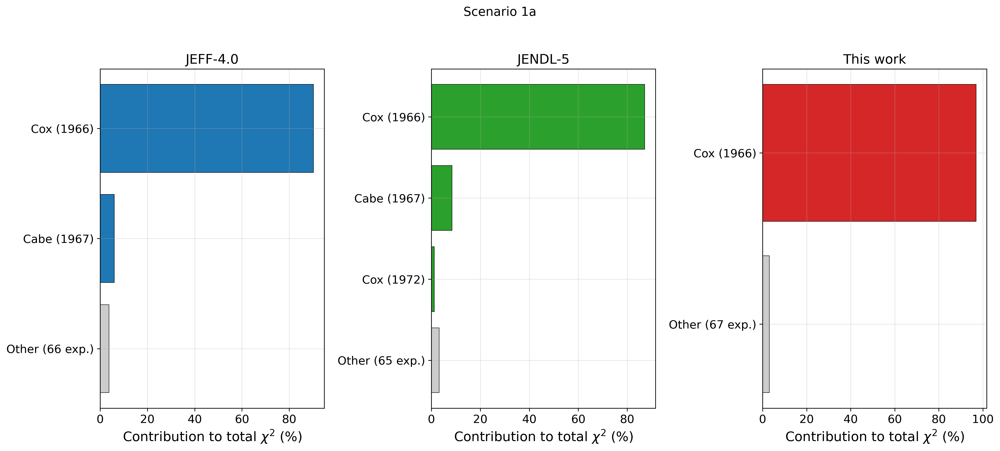

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_1a.png


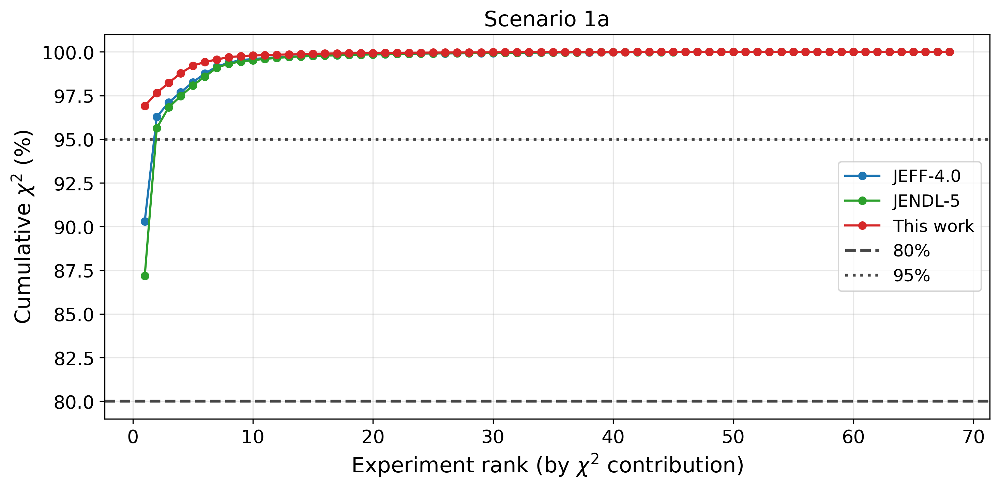

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_1a.png


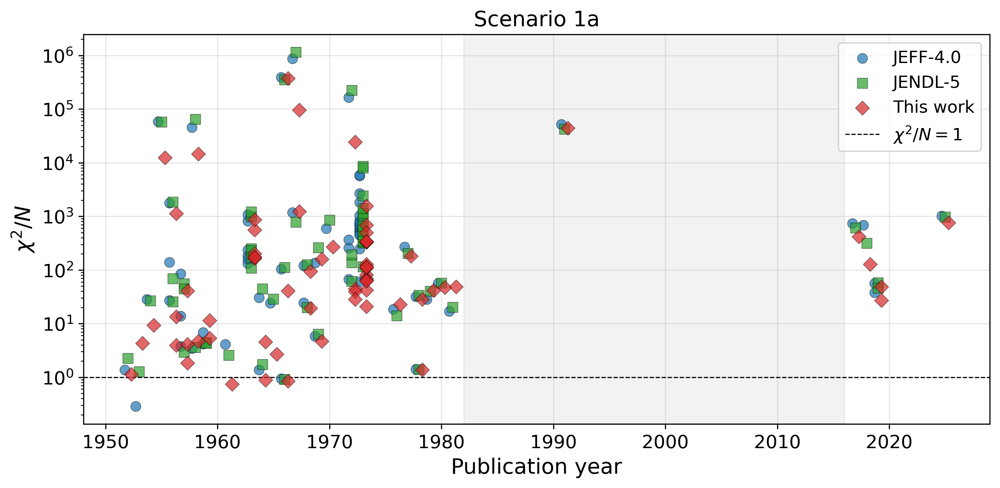


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean    std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 1.084 58.508   -12.728   510.231     70.510     57.982
  JENDL-5 0.805 56.681    -9.274   407.664     69.967     57.542
This work 1.078 55.046   -13.665   527.806     69.717     56.945
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_1a.png


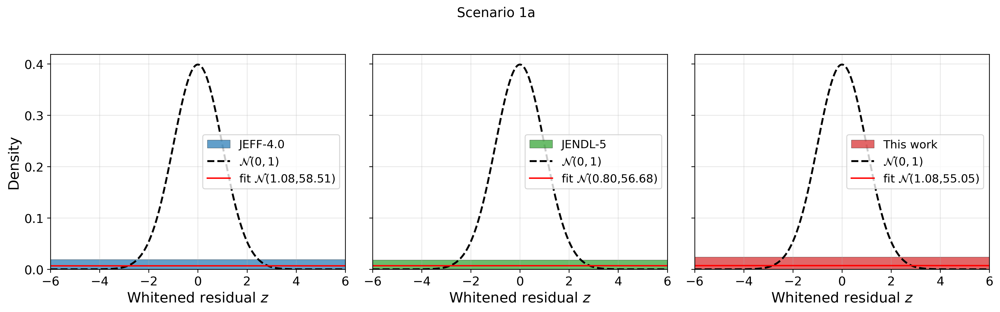

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_1a.png


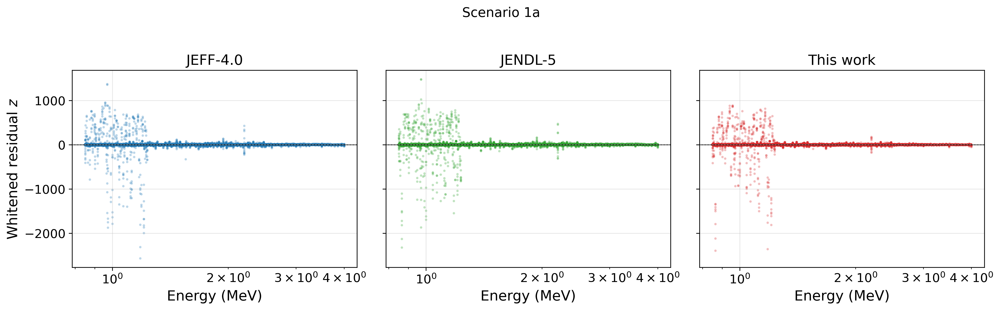

In [5]:
summary_1a = run_scenario(
    df_s=df_all,
    scenario_key='1a',
    scenario_label='All experiments, σ_exp only',
    eval_cov_s=None,
)


## Scenario 1b — All experiments, σ_exp ⊕ σ_eval



SCENARIO 1b: All experiments, σ_exp ⊕ σ_eval
Data points: 140277, Experiments: 68

Rows per library:
library
JEFF         46759
JENDL        46759
This_work    46759

  Library     N  chi2_per_N
 JEFF-4.0 46759      14.564
  JENDL-5 46759       8.613
This work 46759      14.920
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_1b.png


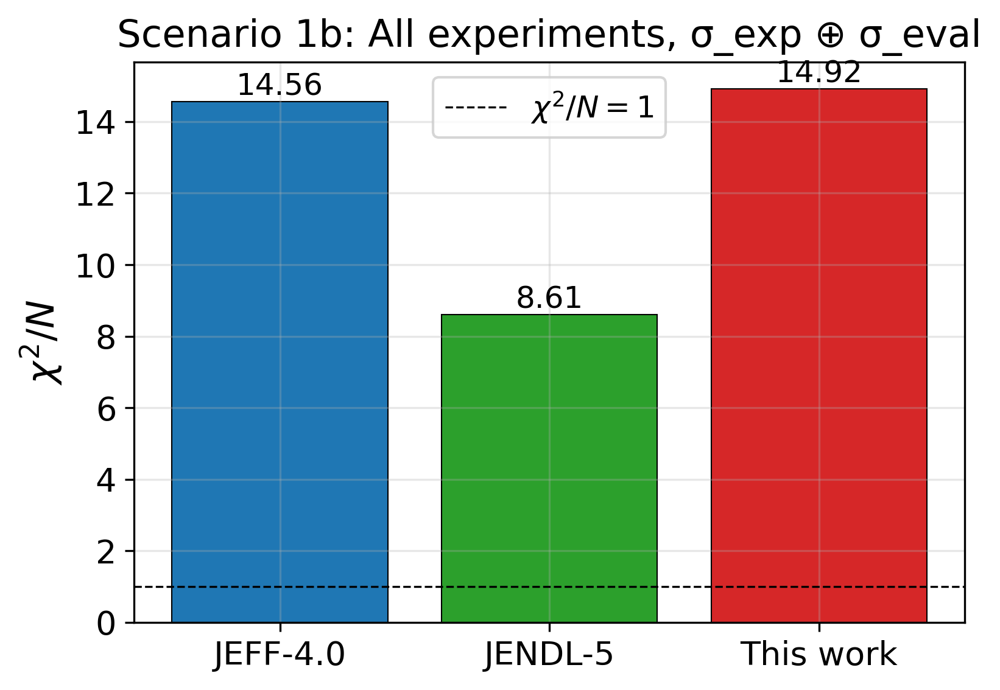


Per-experiment chi^2/N (sorted by avg, descending):

                                            JEFF  JENDL  This_work      N
experiment_id author     year E_min E_max                                
11121007      Wells      1963 0.85  0.98  119.82  28.29      85.57     26
27673002      G. Gkatis  2025 1.01  3.93   68.40  30.15     101.15    784
11121006      Wells      1963 0.85  0.97   83.52  31.14      77.75     25
20482005      Cabe       1967 0.97  0.97   81.97  16.41      34.79     11
11519016      Cox        1966 0.86  1.23   43.16  19.52      59.40    368
11121008      Wells      1963 0.85  0.98   38.10  17.47      47.81     25
40532004      Korzh      1977 1.50  3.00   33.92  15.28      50.66     36
11396011      Cranberg   1956 2.25  2.45   57.37  15.75      23.54      7
14462002      Ramirez    2017 1.30  4.00   20.01   9.46      55.25    134
30076004      Barnard    1968 0.94  1.18   27.52  20.36      26.32    187
20008015      Tomita     1973 2.04  2.04   53.16  15.57   

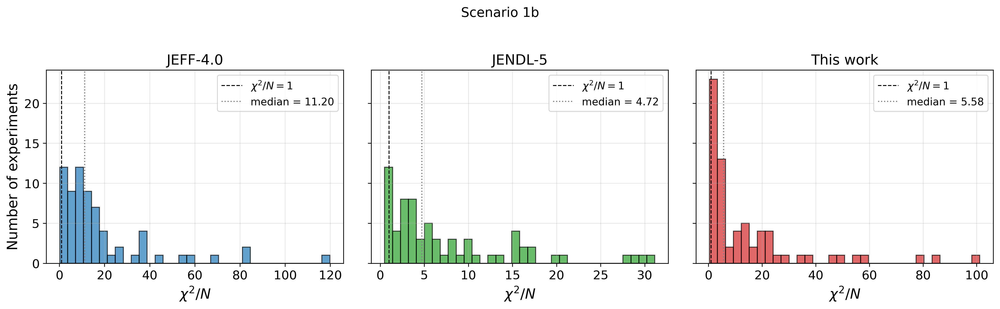

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_1b.png


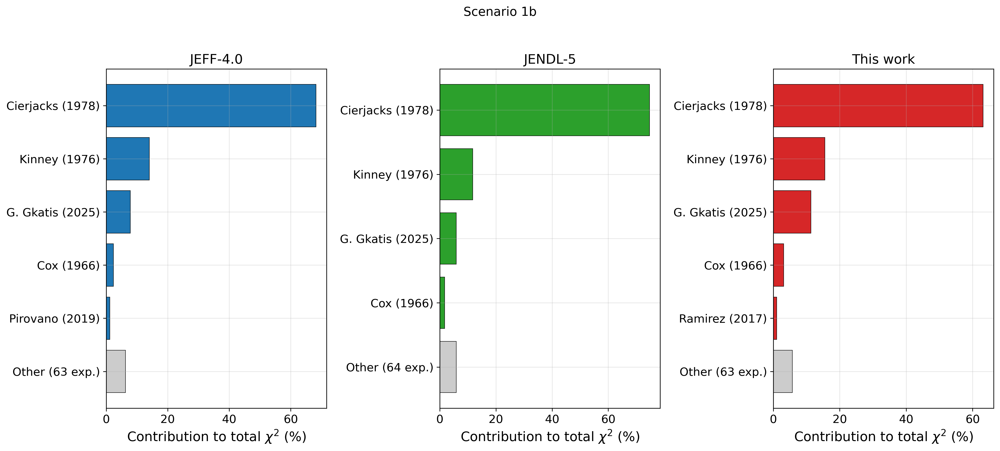

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_1b.png


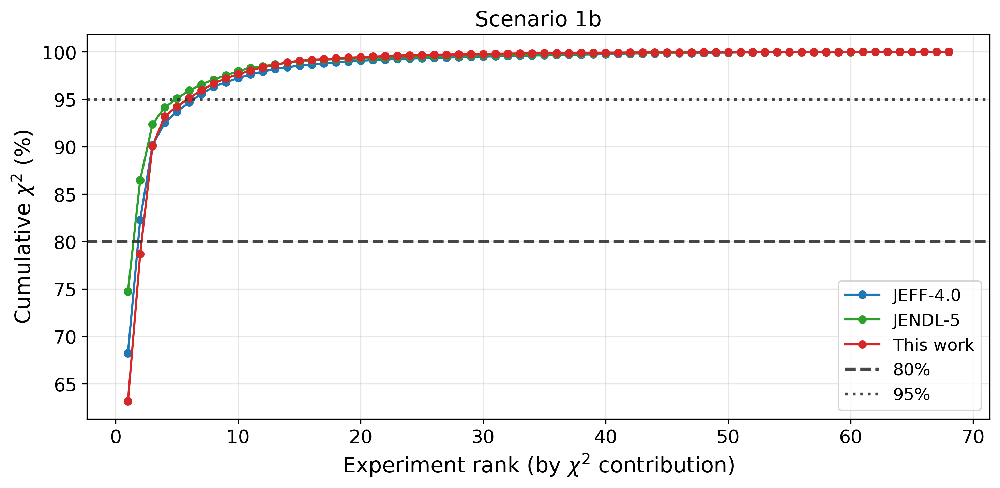

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_1b.png


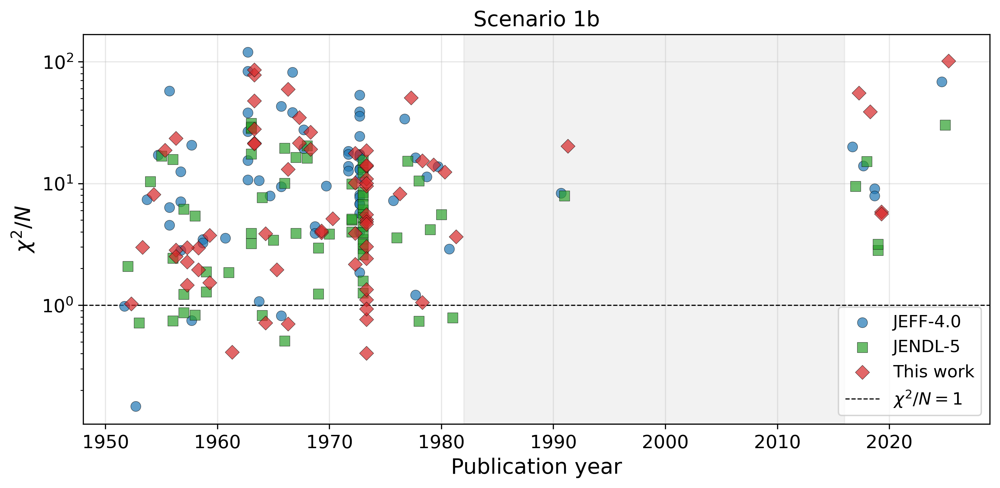


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 0.891 3.711     0.818     9.822     54.441     38.427
  JENDL-5 0.635 2.865     1.243     8.426     42.328     24.560
This work 0.895 3.758     1.022    12.589     54.687     38.983
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_1b.png


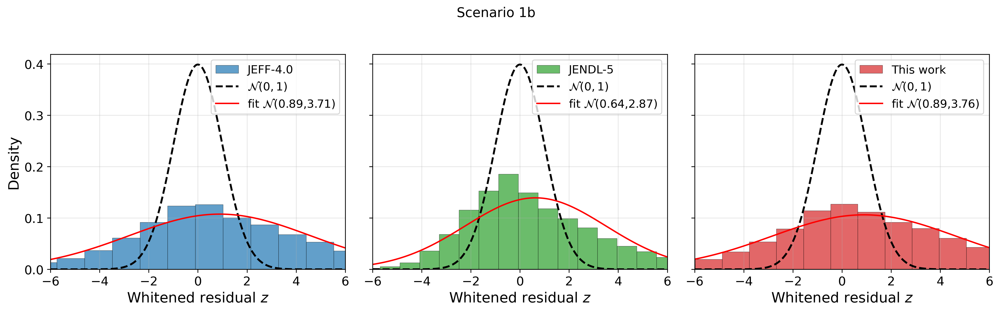

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_1b.png


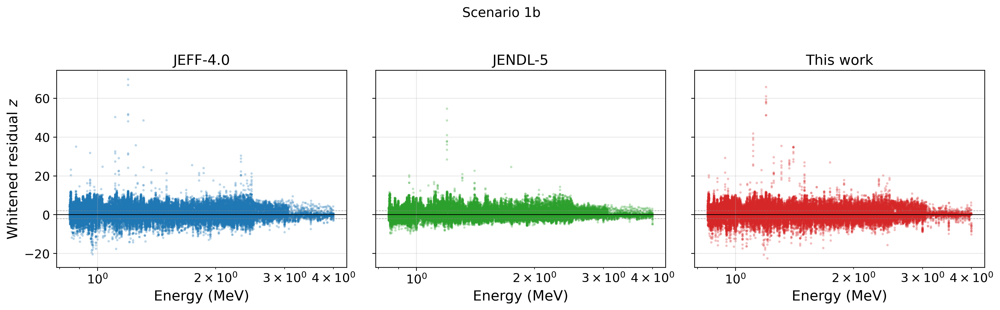

In [6]:
summary_1b = run_scenario(
    df_s=df_all,
    scenario_key='1b',
    scenario_label='All experiments, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Scenario 2a — Excluding K&S, σ_exp only



SCENARIO 2a: Excluding K&S, σ_exp only
Data points: 99183, Experiments: 66

Rows per library:
library
JEFF         33061
JENDL        33061
This_work    33061

  Library     N  chi2_per_N
 JEFF-4.0 33061    4834.835
  JENDL-5 33061    4538.279
This work 33061    4277.283
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_2a.png


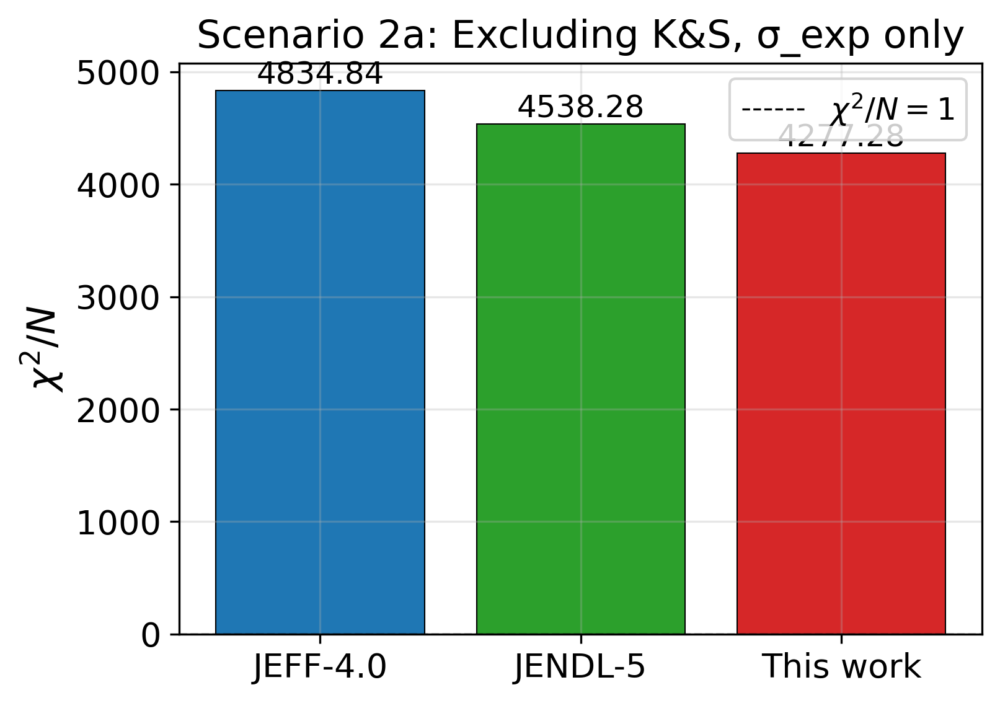


Per-experiment chi^2/N (sorted by avg, descending):

                                               JEFF      JENDL  This_work      N
experiment_id author     year E_min E_max                                       
20482005      Cabe       1967 0.97  0.97  870079.43 1155560.68   96572.22     11
11519016      Cox        1966 0.86  1.23  392911.52  355967.58  373236.63    368
10332004      Cox        1972 0.90  0.90  165654.43  223391.89   24267.18      8
13511004      Perey      1991 0.85  0.85   52077.50   42639.86   43996.42     18
11638003      Darden     1955 1.00  1.55   58501.33   57444.10   12394.77      6
11717002      Landon     1958 2.20  2.20   45870.96   64837.94   14576.02     14
20008003      Tomita     1973 1.47  1.47    5711.52    8626.06    1549.53     13
20008013      Tomita     1973 1.94  1.94    5908.72    8044.13     689.76     14
11396011      Cranberg   1956 2.25  2.45    1774.21    1855.66    1127.91      7
20008004      Tomita     1973 1.56  1.56    1820.83    

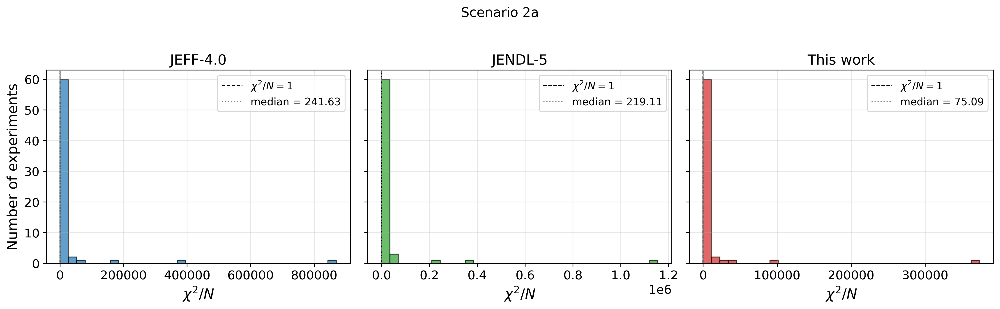

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_2a.png


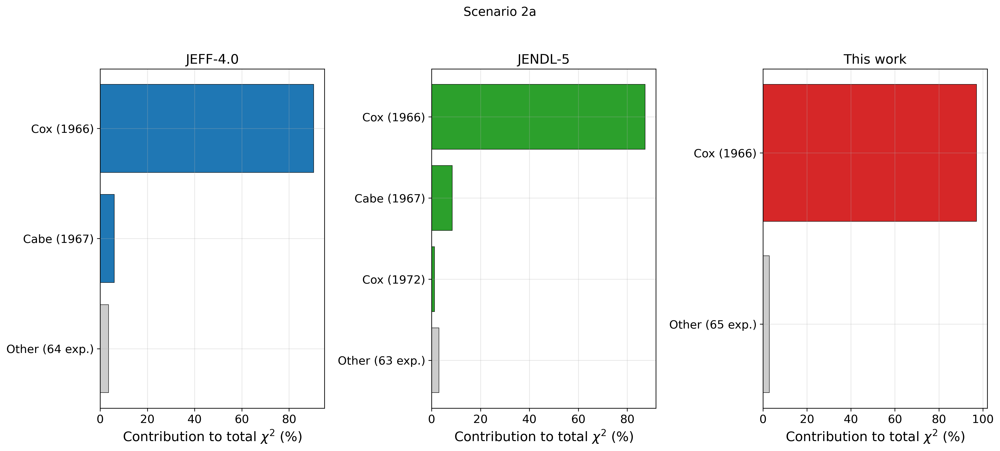

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_2a.png


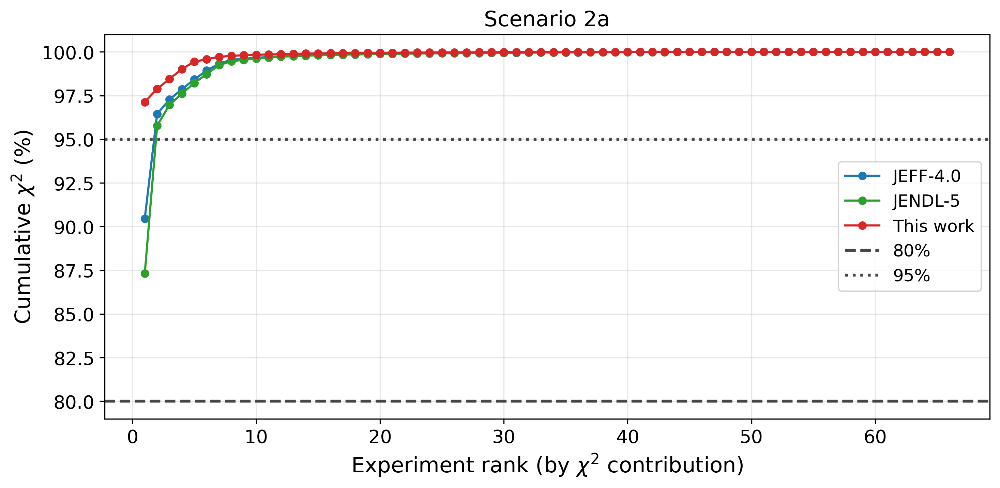

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_2a.png


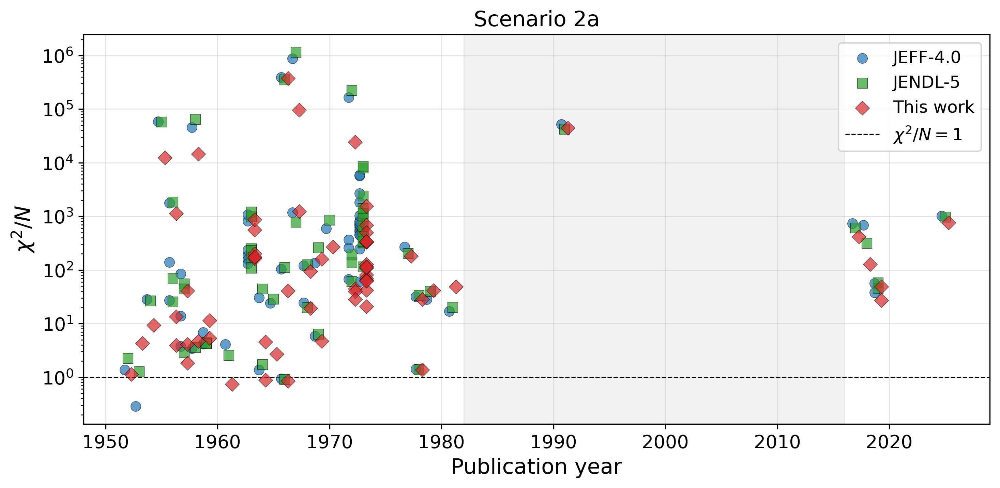


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean    std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 1.530 69.517   -10.752   361.500     74.009     62.965
  JENDL-5 1.131 67.358    -7.830   288.384     74.713     64.475
This work 1.516 65.384   -11.552   374.458     72.043     60.476
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_2a.png


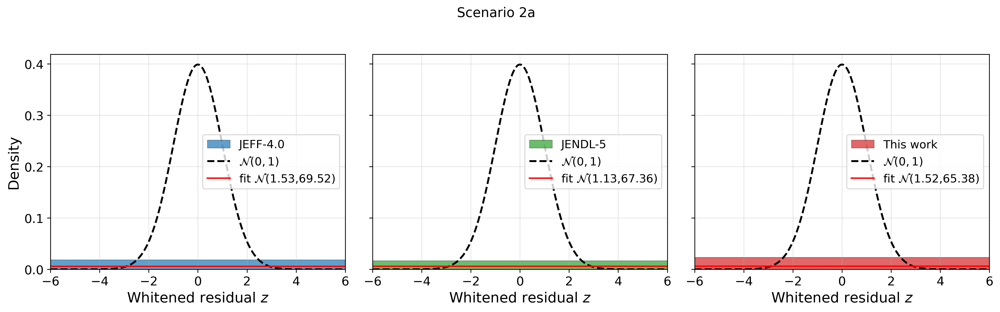

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_2a.png


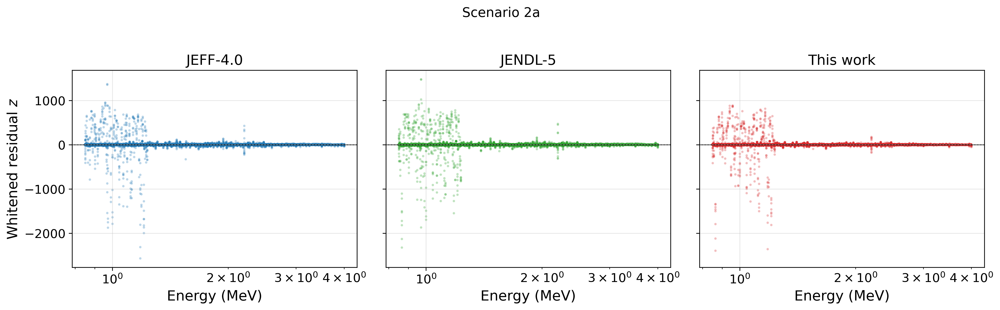

In [7]:
summary_2a = run_scenario(
    df_s=df_no_KS,
    scenario_key='2a',
    scenario_label='Excluding K&S, σ_exp only',
    eval_cov_s=None,
)


## Scenario 2b — Excluding K&S, σ_exp ⊕ σ_eval



SCENARIO 2b: Excluding K&S, σ_exp ⊕ σ_eval
Data points: 99183, Experiments: 66

Rows per library:
library
JEFF         33061
JENDL        33061
This_work    33061

  Library     N  chi2_per_N
 JEFF-4.0 33061      17.503
  JENDL-5 33061      10.667
This work 33061      17.643
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_2b.png


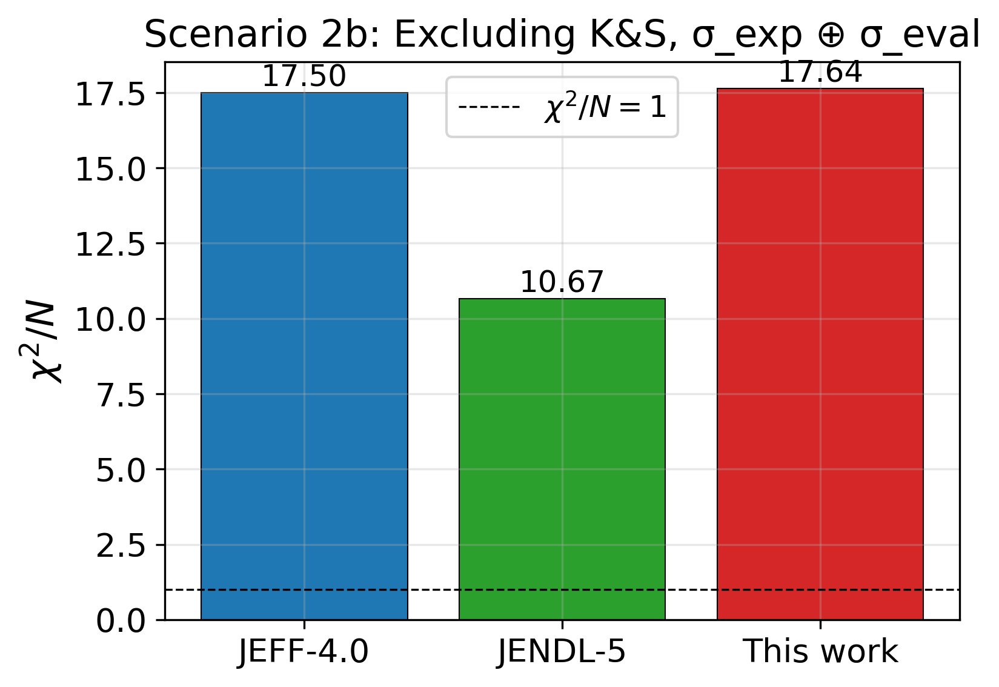


Per-experiment chi^2/N (sorted by avg, descending):

                                            JEFF  JENDL  This_work      N
experiment_id author     year E_min E_max                                
11121007      Wells      1963 0.85  0.98  119.82  28.29      85.57     26
27673002      G. Gkatis  2025 1.01  3.93   68.40  30.15     101.15    784
11121006      Wells      1963 0.85  0.97   83.52  31.14      77.75     25
20482005      Cabe       1967 0.97  0.97   81.97  16.41      34.79     11
11519016      Cox        1966 0.86  1.23   43.16  19.52      59.40    368
11121008      Wells      1963 0.85  0.98   38.10  17.47      47.81     25
40532004      Korzh      1977 1.50  3.00   33.92  15.28      50.66     36
11396011      Cranberg   1956 2.25  2.45   57.37  15.75      23.54      7
14462002      Ramirez    2017 1.30  4.00   20.01   9.46      55.25    134
30076004      Barnard    1968 0.94  1.18   27.52  20.36      26.32    187
20008015      Tomita     1973 2.04  2.04   53.16  15.57   

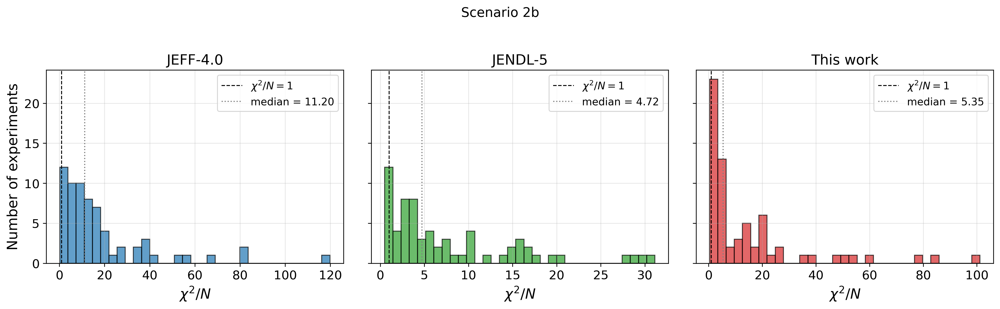

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_2b.png


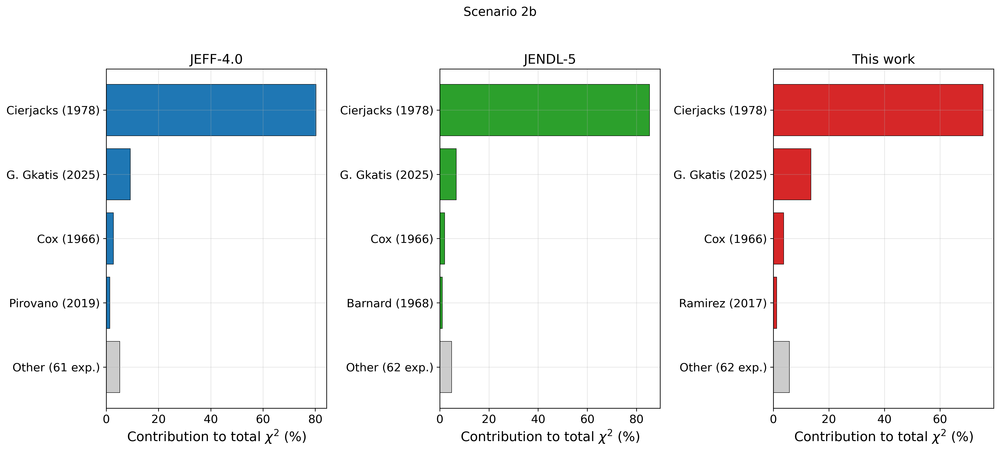

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_2b.png


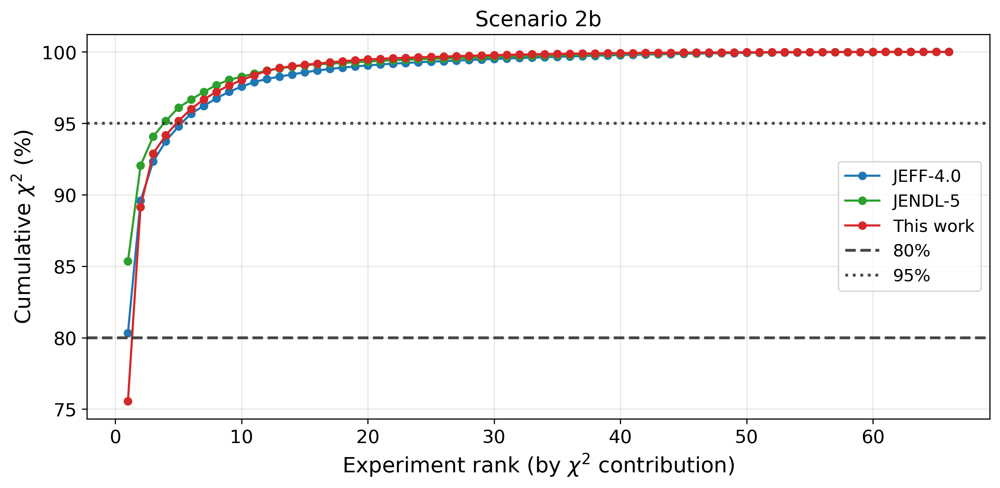

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_2b.png


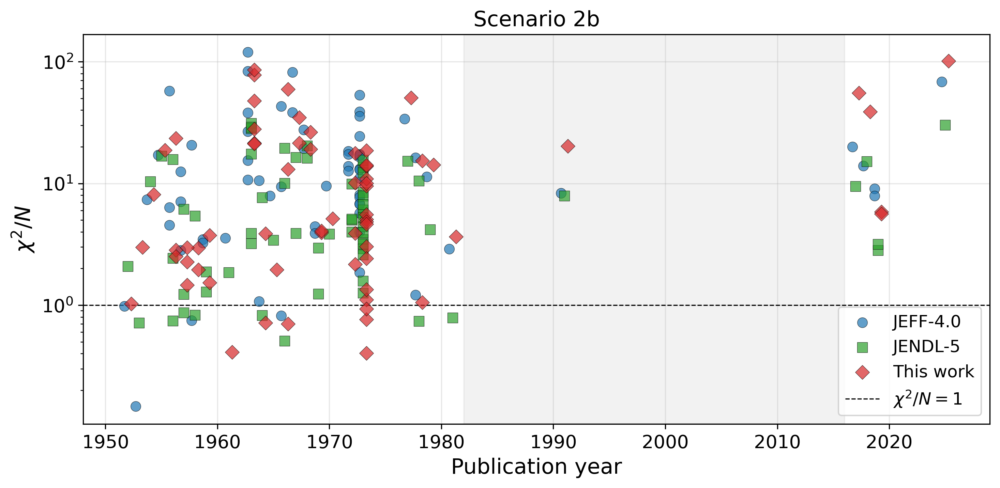


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 1.368 3.954     0.745    10.144     59.336     43.879
  JENDL-5 1.038 3.097     1.073     7.793     48.970     30.359
This work 1.401 3.960     1.060    13.603     58.930     43.846
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_2b.png


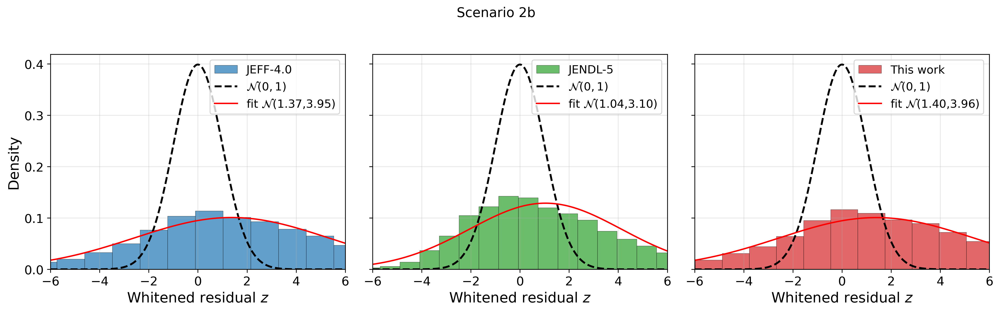

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_2b.png


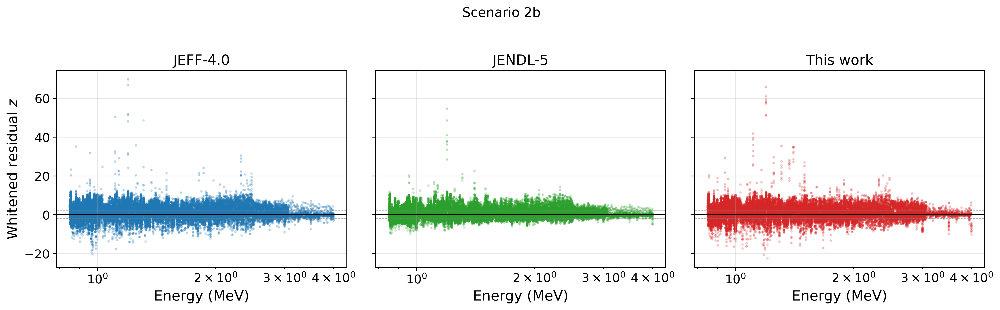

In [8]:
summary_2b = run_scenario(
    df_s=df_no_KS,
    scenario_key='2b',
    scenario_label='Excluding K&S, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Scenario 3a — Only K&S, σ_exp only



SCENARIO 3a: Only K&S, σ_exp only
Data points: 41094, Experiments: 2

Rows per library:
library
JEFF         13698
JENDL        13698
This_work    13698

  Library     N  chi2_per_N
 JEFF-4.0 13698      19.922
  JENDL-5 13698      15.557
This work 13698      23.697
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_3a.png


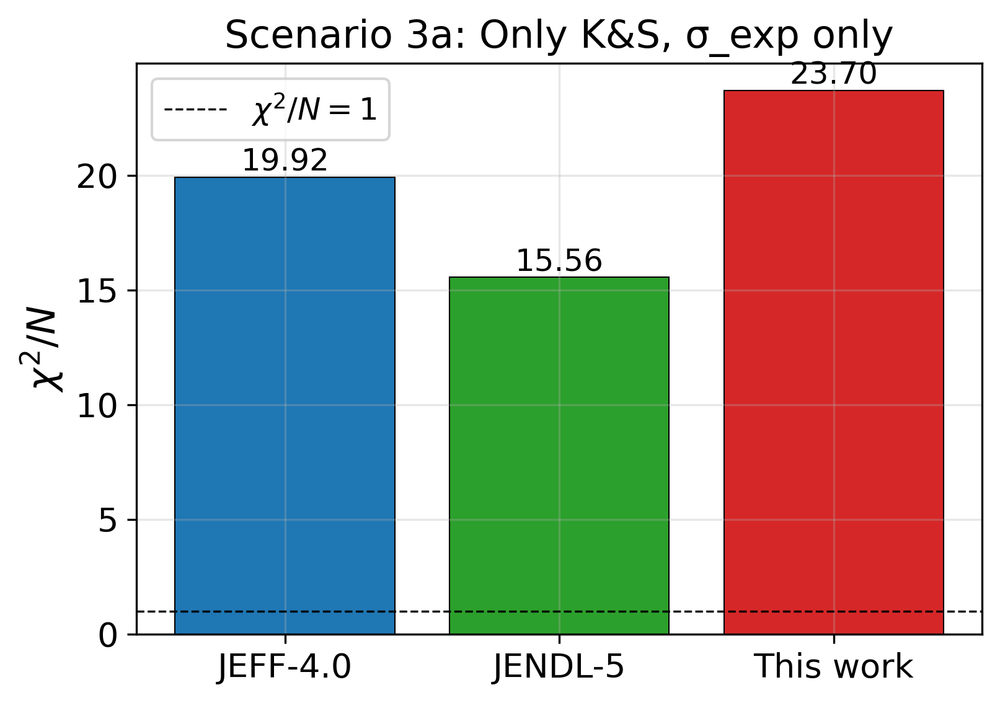


Per-experiment chi^2/N (sorted by avg, descending):

                                       JEFF  JENDL  This_work      N
experiment_id author year E_min E_max                               
10886002      Smith  1980 1.68  3.90  56.46  56.69      47.16    490
10571002      Kinney 1976 0.85  2.50  18.57  14.03      22.83  13208
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_per_experiment_histogram_3a.png


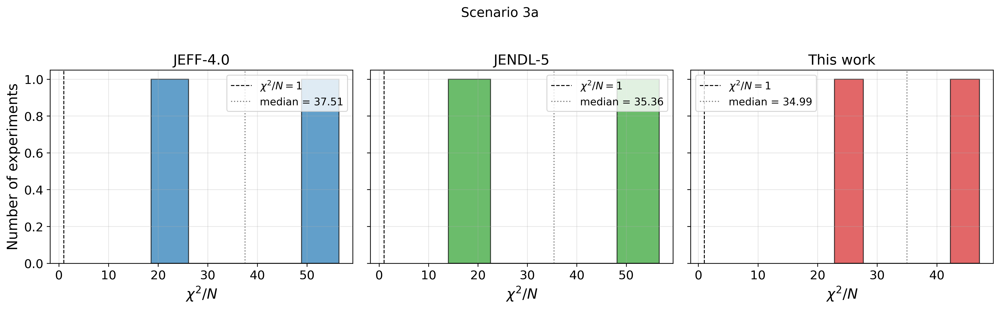

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_3a.png


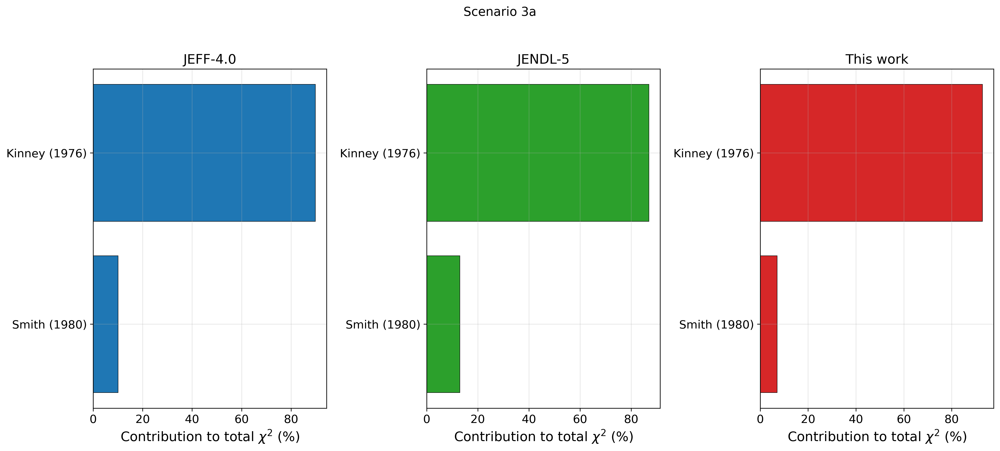

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_3a.png


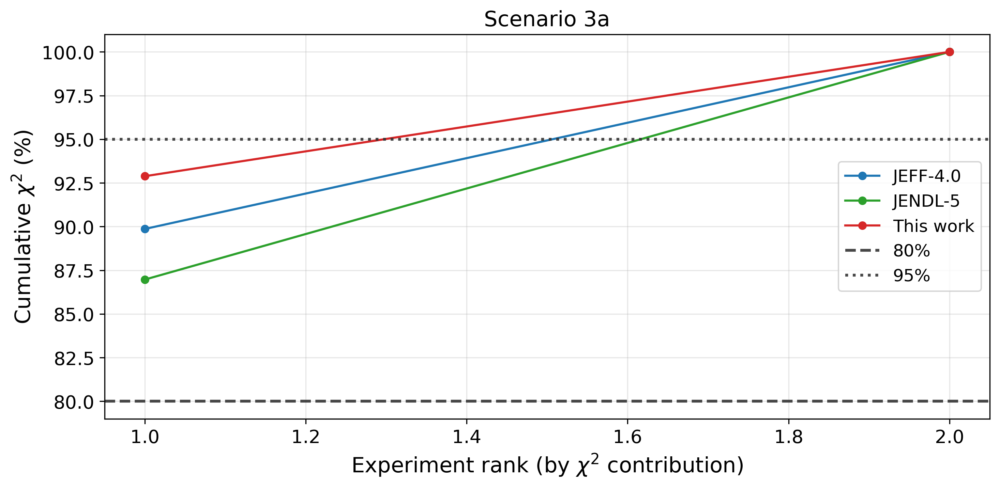

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_3a.png


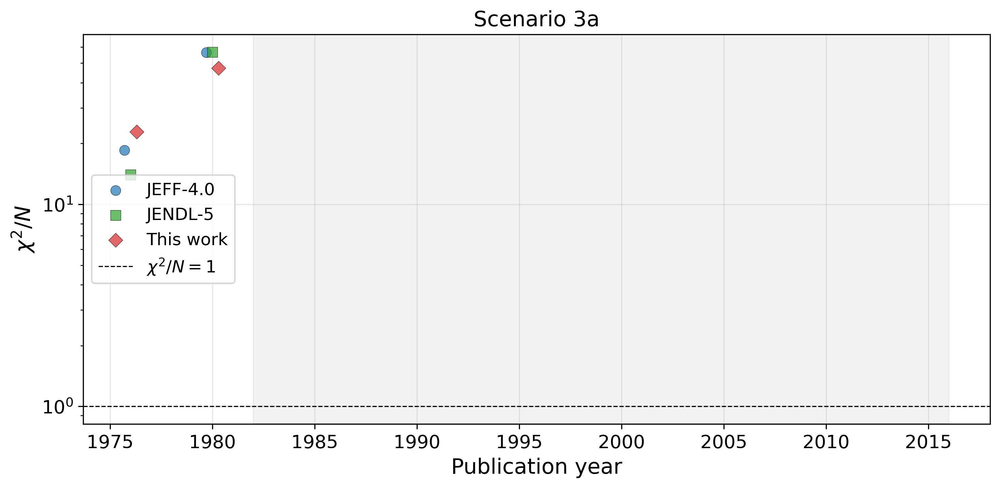


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library  mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 0.005 4.464    -0.624     2.266     62.067     45.956
  JENDL-5 0.017 3.944    -0.506     3.769     58.512     40.809
This work 0.020 4.868    -1.003     3.287     64.104     48.423
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_3a.png


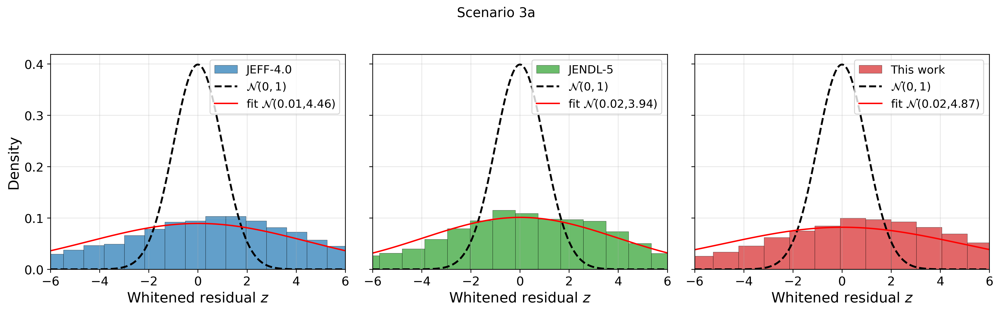

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_3a.png


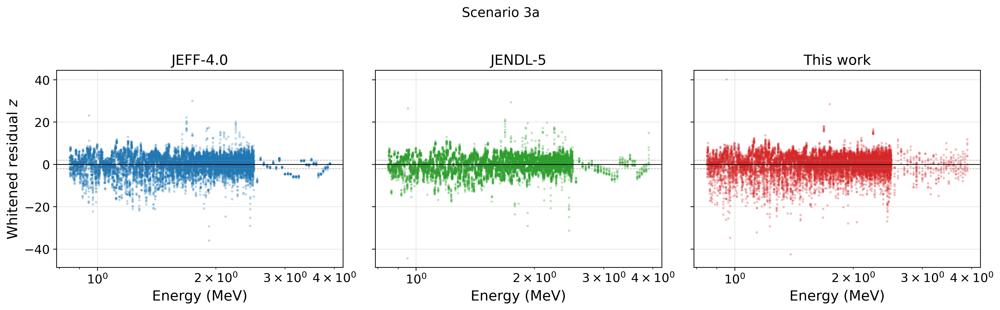

In [9]:
summary_3a = run_scenario(
    df_s=df_only_KS,
    scenario_key='3a',
    scenario_label='Only K&S, σ_exp only',
    eval_cov_s=None,
)


## Scenario 3b — Only K&S, σ_exp ⊕ σ_eval



SCENARIO 3b: Only K&S, σ_exp ⊕ σ_eval
Data points: 41094, Experiments: 2

Rows per library:
library
JEFF         13698
JENDL        13698
This_work    13698

  Library     N  chi2_per_N
 JEFF-4.0 13698       7.471
  JENDL-5 13698       3.655
This work 13698       8.346
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_global_bar_3b.png


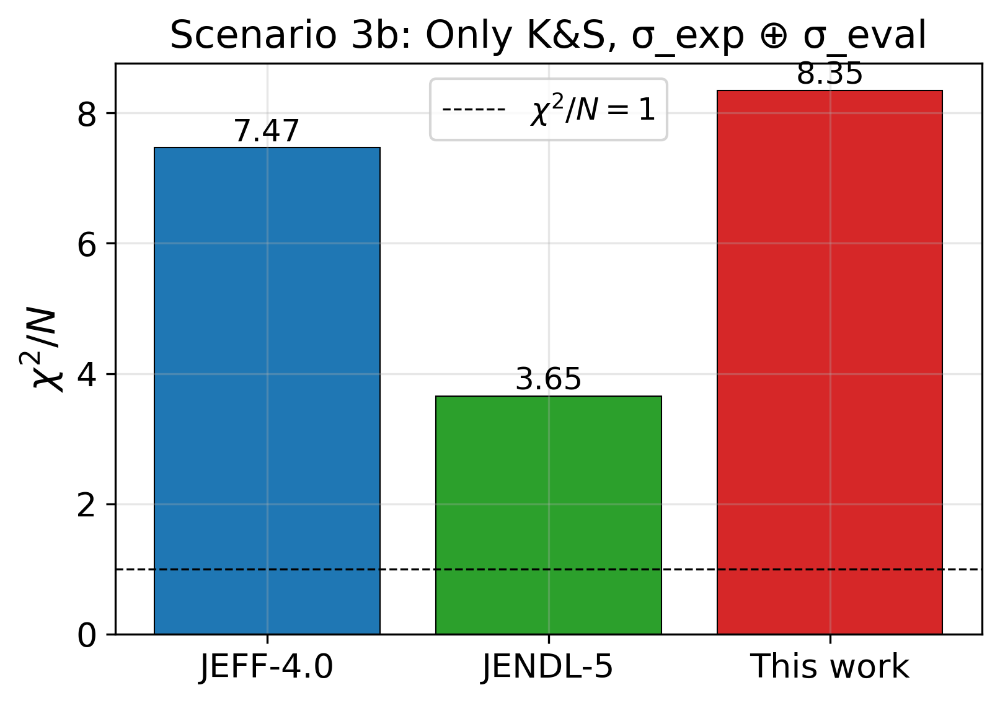


Per-experiment chi^2/N (sorted by avg, descending):

                                       JEFF  JENDL  This_work      N
experiment_id author year E_min E_max                               
10886002      Smith  1980 1.68  3.90  13.79   5.53      12.41    490
10571002      Kinney 1976 0.85  2.50   7.24   3.59       8.20  13208
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_per_experiment_histogram_3b.png


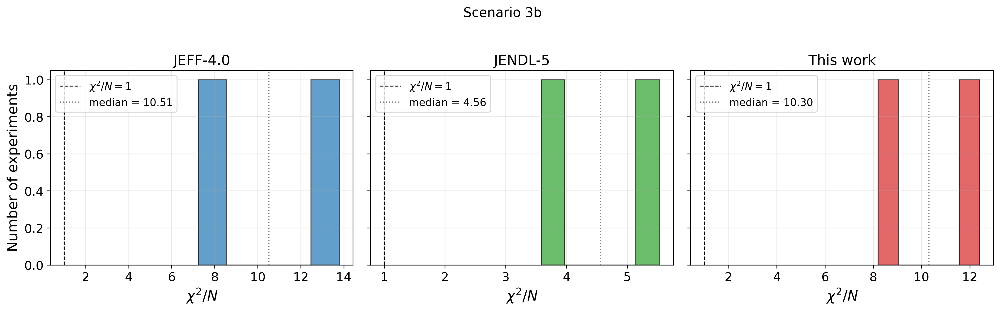

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_contribution_3b.png


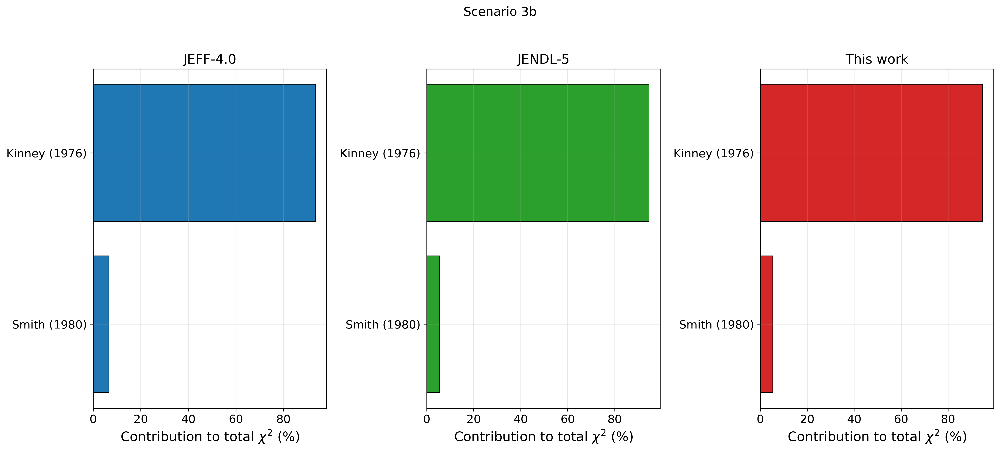

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_waterfall_3b.png


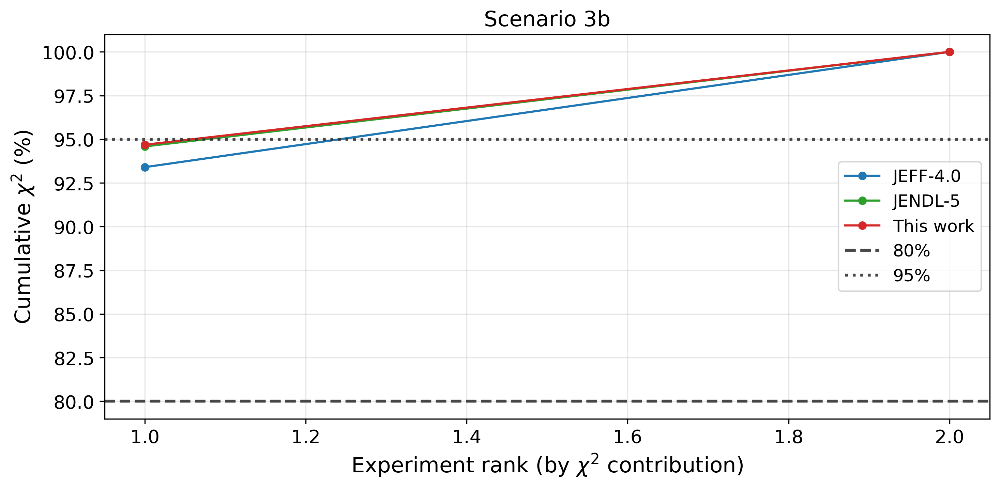

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_vs_year_3b.png


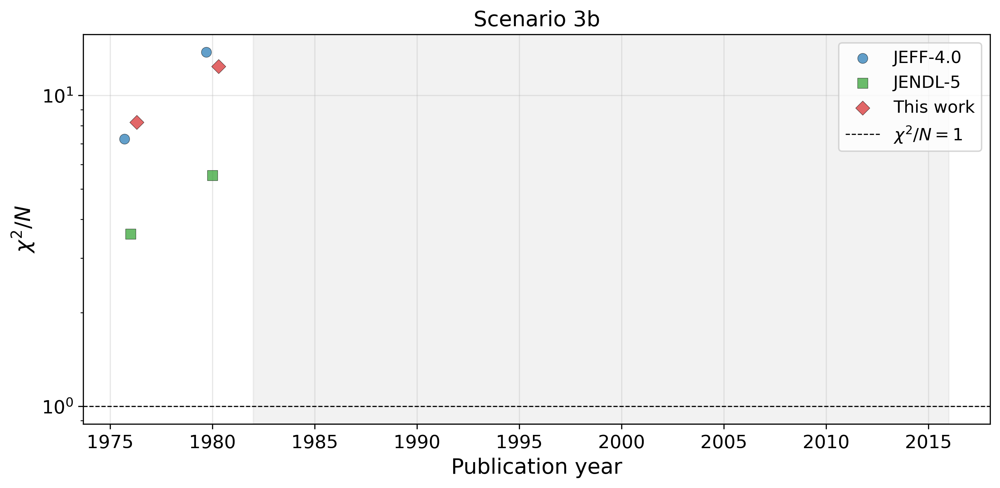


Whitened residual statistics (N(0,1) target: mean=0, std=1, skew=0, kurt=0, |z|>2: 4.6%, |z|>3: 0.3%)

  Library   mean   std  skewness  kurtosis  |z|>2 (%)  |z|>3 (%)
 JEFF-4.0 -0.262 2.721     0.214     1.457     42.627     25.266
  JENDL-5 -0.338 1.882     0.903     4.118     26.296     10.564
This work -0.327 2.871     0.019     1.448     44.444     27.245
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_histograms_3b.png


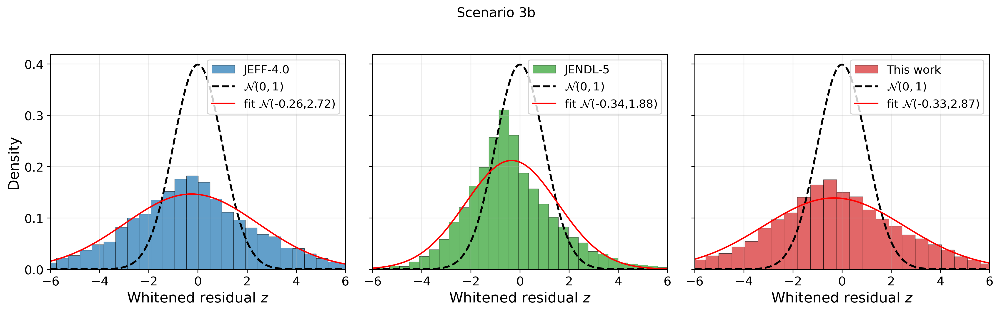

Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/whitened_residual_vs_energy_3b.png


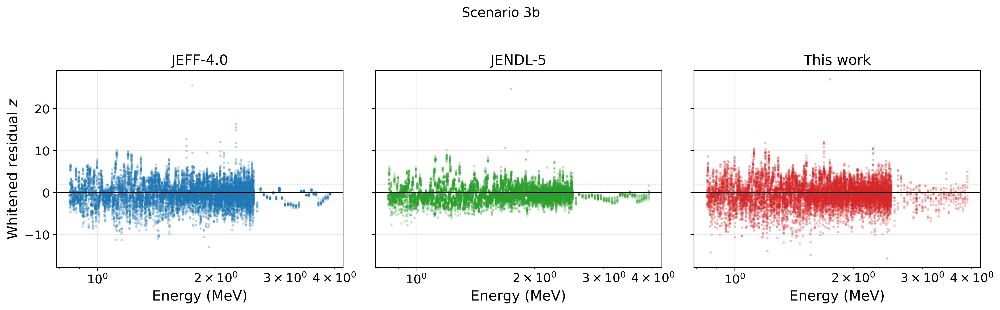

In [10]:
summary_3b = run_scenario(
    df_s=df_only_KS,
    scenario_key='3b',
    scenario_label='Only K&S, σ_exp ⊕ σ_eval',
    eval_cov_s=eval_cov,
)


## Per-subentry breakdown — Kinney 1976 vs Smith 1980 vs OTHER

Splits Mahalanobis $\chi^2/N$ by K&S label inside the full dataset, for both
variance budgets ($\sigma_\mathrm{exp}$ only and $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$).


In [11]:
# ── Per-(library, ks_subentry) Mahalanobis chi^2/N ────────────────────────────


def _per_subentry_table(df_in, label, eval_cov_in):
    rows = []
    for ks_label in ['Kinney_1976', 'Smith_1980', 'OTHER']:
        sub_ks = df_in[df_in['ks_subentry'] == ks_label]
        if len(sub_ks) == 0:
            continue
        per_exp = chi2_metrics.mahalanobis_chi2_per_experiment(sub_ks, eval_cov_in)
        for lib in LIBRARIES:
            sl = per_exp[per_exp['library'] == lib]
            n = int(sl['N'].sum())
            chi2 = float(sl['chi2'].sum())
            rows.append({'subentry': ks_label, 'Library': LIB_LABELS[lib],
                         'N': n, 'chi2/N': chi2 / n if n > 0 else np.nan})
    per_exp_all = chi2_metrics.mahalanobis_chi2_per_experiment(df_in, eval_cov_in)
    for lib in LIBRARIES:
        sl = per_exp_all[per_exp_all['library'] == lib]
        n = int(sl['N'].sum())
        chi2 = float(sl['chi2'].sum())
        rows.append({'subentry': 'BOTH/ALL', 'Library': LIB_LABELS[lib],
                     'N': n, 'chi2/N': chi2 / n if n > 0 else np.nan})
    out = pd.DataFrame(rows)
    pivot = out.pivot_table(index='subentry', columns='Library', values='chi2/N', sort=False)
    pivot_n = out.pivot_table(index='subentry', columns='Library', values='N',
                              sort=False, aggfunc='first')
    first_lib = LIB_LABELS[LIBRARIES[0]]
    pivot.insert(0, 'N', pivot_n[first_lib].astype(int))
    print(f"\n{label}")
    print(pivot.to_string(float_format='%.3f'))


_per_subentry_table(df, 'σ_exp only:', None)
_per_subentry_table(df, 'σ_exp ⊕ σ_eval:', eval_cov)



σ_exp only:
Library          N  JEFF-4.0  JENDL-5  This work
subentry                                        
Kinney_1976  13208    18.567   14.031     22.827
Smith_1980     490    56.462   56.689     47.159
OTHER        33061  4834.835 4538.279   4277.283
BOTH/ALL     46759  3424.312 3213.353   3031.199

σ_exp ⊕ σ_eval:
Library          N  JEFF-4.0  JENDL-5  This work
subentry                                        
Kinney_1976  13208     7.237    3.585      8.196
Smith_1980     490    13.786    5.530     12.406
OTHER        33061    17.503   10.667     17.643
BOTH/ALL     46759    14.564    8.613     14.920


## Combined comparison — six scenarios side-by-side

Per-library Mahalanobis $\chi^2/N$ across the six scenarios. The drop from
$\sigma_\mathrm{exp}$-only (a) to $\sigma_\mathrm{exp}\oplus\sigma_\mathrm{eval}$ (b) shows
how much of the residual the library-claimed (MF34+MF33) covariance absorbs.


COMBINED SUMMARY — Mahalanobis chi^2/N across the six scenarios

  Library  1a: all, exp  1b: all, exp+eval  2a: no_KS, exp  2b: no_KS, exp+eval  3a: only_KS, exp  3b: only_KS, exp+eval
 JEFF-4.0      3424.312             14.564        4834.835               17.503            19.922                  7.471
  JENDL-5      3213.353              8.613        4538.279               10.667            15.557                  3.655
This work      3031.199             14.920        4277.283               17.643            23.697                  8.346
Saved: /share_snc/snc/JuanMonleon/DA_Figures/chi2_library_c0/chi2_combined_comparison.png


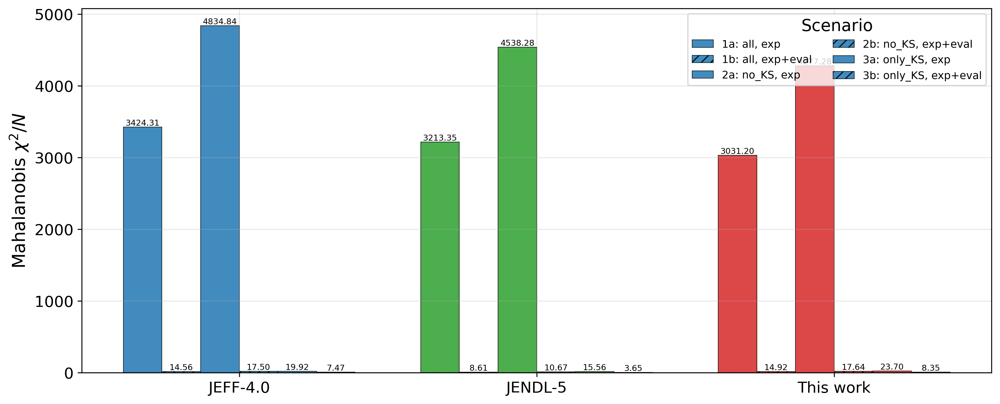


--- Best library per scenario ---
  1a: all, exp            -> This work
  1b: all, exp+eval       -> JENDL-5
  2a: no_KS, exp          -> This work
  2b: no_KS, exp+eval     -> JENDL-5
  3a: only_KS, exp        -> JENDL-5
  3b: only_KS, exp+eval   -> JENDL-5


In [12]:
# ── Combined summary table + grouped bar ─────────────────────────────────────

renamed = {
    '1a': '1a: all, exp',
    '1b': '1b: all, exp+eval',
    '2a': '2a: no_KS, exp',
    '2b': '2b: no_KS, exp+eval',
    '3a': '3a: only_KS, exp',
    '3b': '3b: only_KS, exp+eval',
}

combined = summary_1a.rename(columns={'chi2_per_N': renamed['1a'], 'N': 'N_1a'})
for key in ['1b', '2a', '2b', '3a', '3b']:
    s = globals()[f'summary_{key}'].rename(columns={'chi2_per_N': renamed[key], 'N': f'N_{key}'})
    combined = combined.merge(s, on=['Library', 'library_key'])

print("=" * 100)
print("COMBINED SUMMARY — Mahalanobis chi^2/N across the six scenarios")
print("=" * 100)
print()
print(combined[['Library'] + [renamed[k] for k in ['1a','1b','2a','2b','3a','3b']]]
      .to_string(index=False, float_format='%.3f'))

scenario_cols = [renamed[k] for k in ['1a', '1b', '2a', '2b', '3a', '3b']]
x = np.arange(len(LIBRARIES))
width = 0.13
hatches = ['', '///', '', '///', '', '///']

fig, ax = plt.subplots(figsize=(12, 5))
for i, scen in enumerate(scenario_cols):
    vals = [combined.loc[combined['library_key'] == lib, scen].values[0]
            for lib in LIBRARIES]
    bars = ax.bar(x + i * width, vals, width,
                  color=[LIB_COLORS[lib] for lib in LIBRARIES],
                  edgecolor='k', linewidth=0.5, alpha=0.85,
                  hatch=hatches[i], label=scen)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                f'{val:.2f}', ha='center', va='bottom', fontsize=7)

ax.set_xticks(x + 2.5 * width)
ax.set_xticklabels([LIB_LABELS[lib] for lib in LIBRARIES])
ax.set_ylabel(r'Mahalanobis $\chi^2 / N$')
ax.axhline(1.0, color='k', ls='--', lw=0.8)
ax.legend(title='Scenario', fontsize=9, ncol=2)
fig.tight_layout(); save_fig(fig, 'chi2_combined_comparison'); plt.show()

print("\n--- Best library per scenario ---")
for scen in scenario_cols:
    best_idx = combined[scen].idxmin()
    print(f"  {scen:22s}  -> {combined.loc[best_idx, 'Library']}")


In [13]:
print('Done.')


Done.
